# Quickstart
[![Binder](https://mybinder.org/badge_logo.svg)](https://mybinder.org/v2/gh/asaboor-gh/ipyvasp/HEAD?urlpath=%2Fdoc%2Ftree%2Fdocs%2Fsource%2Fnotebooks%2Fquickstart.ipynb)

In [1]:
import numpy as np
import matplotlib.pyplot as plt

import ipyvasp as ipv

## Transform POSCAR
Let's create some dummy POSCAR.

In [2]:
poscar = ipv.POSCAR.new(
    [[0.5, 0.5, 0.0], [0.0, 0.5, 0.5], [0.5, 0.0, 0.5]],
    {"Ga": [[0.0, 0.0, 0.0]],"As": [[0.25, 0.25, 0.25]]},
    
    scale = 5
)
site_kws = dict(alpha=1)
ax1, ax2, ax3 = ipv.get_axes((8,3),ncols=3, axes_3d=[0,1,2])

poscar.splot_lattice( ax = ax1, fill = False,label='original',
    site_kws=site_kws)

_ = poscar.transform(lambda a,b,c: (b+c-a, a+c-b, a+b-c)).transpose([1,2,0]) # bring a1 to x
print(poscar.last.data.metadata.TM)
poscar.last.splot_lattice( # .last points to last created POSCAR in transform
    ax=ax2, fill = False, color='red', label='transformed',
    site_kws=site_kws
)
poscar.last.splot_plane([1,1,0],1/2,ax=ax2)

poscar.transform(lambda a,b,c: (a-c,b-c,a+b+c)
).set_zdir([0,0,1]).splot_lattice(ax=ax3,color='red')

print(poscar.last.data.metadata.TM)
ax1.view_init(azim=-25, elev=15)
ax2.view_init(azim=-35, elev=15)

[[0.  0.5 0.5]
 [0.5 0.  0.5]
 [0.5 0.5 0. ]]


[[ 0.66666667 -0.33333333  0.33333333]
 [-0.33333333  0.66666667  0.33333333]
 [-0.33333333 -0.33333333  0.33333333]]


<Figure size 1152x432 with 0 Axes>

In [3]:
poscar.splot_bz(fill = True,color='skyblue', vectors=None,lw=0.1).set_axis_off()
ax = poscar.splot_kpath([(0,0,0), (1/4,1/2,-1/4), (0.5,0.5,0), (0,0,0), (0,0.5,0)],
    labels = ['Γ', 'K', 'X', 'Γ', 'L'], fmt_label=lambda lab: lab+'\n')
ax.view_init(azim=55, elev=25)

<Figure size 489.6x489.6 with 0 Axes>

In [4]:
fig = poscar.iplot_bz(color='blue')
ipv.iplot2html(fig)

## K-Path
We can interplate kpath based on current POSCAR, it gives correct distance between points.

In [5]:
poscar.get_kpath([
    (0,0,0,'Γ'), 
    (1/4,1/2,-1/4,'K'), 
    (0.5,0.5,0,'X'), 
    (0,0,0,'Γ'), 
    (0,0.5,0,'L')
    ], n=8)

Automatically generated using ipyvasp for HSK-PATH 0:Γ, 4:K, 5:X, 9:Γ, 12:L
	13
Reciprocal Lattice
    0.0000000000    0.0000000000    0.0000000000    0.076923
    0.0625000000    0.1250000000   -0.0625000000    0.076923
    0.1250000000    0.2500000000   -0.1250000000    0.076923
    0.1875000000    0.3750000000   -0.1875000000    0.076923
    0.2500000000    0.5000000000   -0.2500000000    0.076923
    0.5000000000    0.5000000000    0.0000000000    0.076923
    0.3750000000    0.3750000000    0.0000000000    0.076923
    0.2500000000    0.2500000000    0.0000000000    0.076923
    0.1250000000    0.1250000000    0.0000000000    0.076923
    0.0000000000    0.0000000000    0.0000000000    0.076923
    0.0000000000    0.1666666667    0.0000000000    0.076923
    0.0000000000    0.3333333333    0.0000000000    0.076923
    0.0000000000    0.5000000000    0.0000000000    0.076923


In [6]:
poscar.get_kmesh(2,2,2, weight=0)

Generated uniform mesh using ipyvasp, GRID-SHAPE = [2,2,2]
	8
Reciprocal
    0.0000000000    0.0000000000    0.0000000000    0.000000
    1.0000000000    0.0000000000    0.0000000000    0.000000
    0.0000000000    1.0000000000    0.0000000000    0.000000
    1.0000000000    1.0000000000    0.0000000000    0.000000
    0.0000000000    0.0000000000    1.0000000000    0.000000
    1.0000000000    0.0000000000    1.0000000000    0.000000
    0.0000000000    1.0000000000    1.0000000000    0.000000
    1.0000000000    1.0000000000    1.0000000000    0.000000


In [7]:
view = poscar.view_ngl(color='red', dashboard=True)
view

ImportError: Please install nglview to use this function.

If you are not seeing interactive widget above, don't worry! We've got you covered with a screenshot below:

In [8]:
view.download_image('nglview.png',factor=8, trim=True,)

NameError: name 'view' is not defined

<img src="nglview.png" alt="GaAs" width="200"/>

## Live View of POSCAR Operations
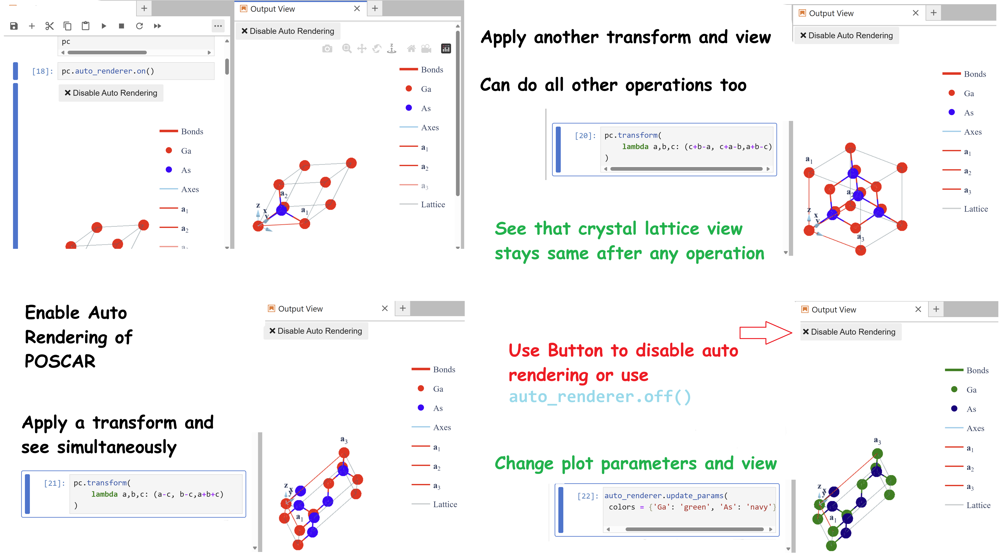

## Batch analysis using `Files` class.


In [9]:
files = ipv.Files('..')
files

Files(
  PosixPath('../_autosummary'),
  PosixPath('../apidoc.rst'),
  PosixPath('../conf.py'),
  PosixPath('../examples.rst'),
  PosixPath('../index.rst'),
  PosixPath('../modules.rst'),
  PosixPath('../notebooks'),
  PosixPath('../summary.rst')
) 8 items

In [10]:
files.summarize(lambda path: {'end': path.parts[-1]})

,end,FILE
0,_autosummary,../_autosummary
1,apidoc.rst,../apidoc.rst
2,conf.py,../conf.py
3,examples.rst,../examples.rst
4,index.rst,../index.rst
5,modules.rst,../modules.rst
6,notebooks,../notebooks
7,summary.rst,../summary.rst


In [11]:
files.map(lambda p: p.suffix,to_df=True)

,0,1
0,../_autosummary,
1,../apidoc.rst,.rst
2,../conf.py,.py
3,../examples.rst,.rst
4,../index.rst,.rst
5,../modules.rst,.rst
6,../notebooks,
7,../summary.rst,.rst


In [12]:
files.input_info()

Skipping paths that do not exist: ['../POSCAR']


""


In [13]:
files.interactive(lambda file: print(file))

In [14]:
files.filtered('py')

Files(
  PosixPath('../conf.py')
) 1 items

### Example: View Lattice and BZ side by side

In [15]:
import plotly.graph_objects as go
import ipyvasp as ipv
fs = ipv.Files('<root_path>','**/POSCAR')

@fs.interact(fig1 = go.FigureWidget(), fig2 = go.FigureWidget(),
    app_layout={"left_sidebar": ('file', 'fig1'), 'center':('fig2',)})
def view(file, fig1, fig2):
    pos = ipv.POSCAR(file)
    ipv.iplot2widget(pos.iplot_bz(), fig_widget=fig2)
    ipv.iplot2widget(pos.iplot_lattice(), fig_widget=fig1)

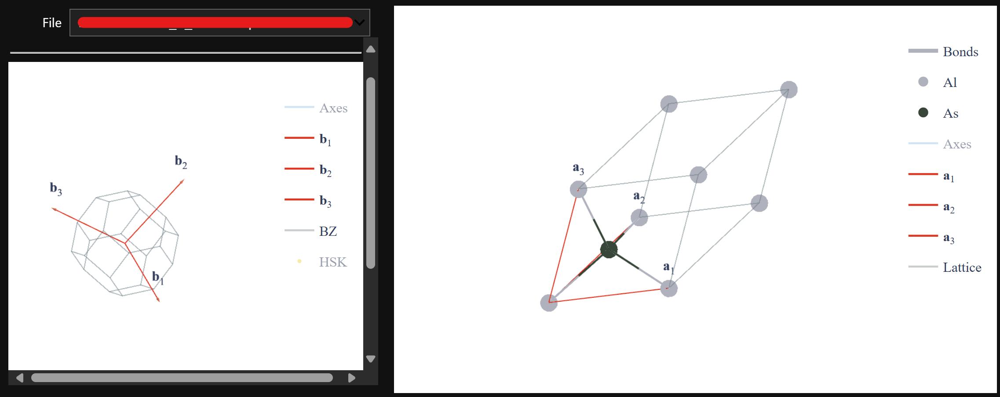